In [83]:
# Import Libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) # Adjusts the configuration of the plots I will create

# Read in the data

pd.options.mode.chained_assignment = None

df = pd.read_csv(r'C:\Users\User\Desktop\Portfolio Project 1\Movies Project\movies.csv')



In [3]:
# Showcasing a summary of the dataset
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [86]:
# Checking for any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))
    

name - 0%
rating - 0%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [87]:
df = df.dropna()

In [59]:
# Data Types of each of the columns

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [88]:
# Changing the data types of columns

df['budget'] = df['budget'].astype('int64') 
df['gross'] = df['gross'].astype('int64') 
df['votes'] = df['votes'].astype('int64') 

In [93]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,6587,6,6,1980,1705,8.4,927000,2589,4014,1047,54,19000000,46998772,2319,146.0
1,5573,6,1,1980,1492,5.8,65000,2269,1632,327,55,4500000,58853106,731,104.0
2,5142,4,0,1980,1771,8.7,1200000,1111,2567,1745,55,18000000,538375067,1540,124.0
3,286,4,4,1980,1492,7.7,221000,1301,2000,2246,55,3500000,83453539,1812,88.0
4,1027,6,4,1980,1543,7.3,108000,1054,521,410,55,6000000,39846344,1777,98.0


In [62]:
# Creating the correct year column

df['yearcorrect'] = df['released'].str.extract(pat = '([0-9]{4})').astype(int)

In [89]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,533,5,0,2009,696,7.8,1100000,1155,1778,2334,55,237000000,2847246203,2253,162.0
7445,535,5,0,2019,183,8.4,903000,162,743,2241,55,356000000,2797501328,1606,181.0
3045,6896,5,6,1997,704,7.8,1100000,1155,1778,1595,55,200000000,2201647264,2253,194.0
6663,5144,5,0,2015,698,7.8,876000,1125,2550,524,55,245000000,2069521700,1540,138.0
7244,536,5,0,2018,192,8.4,897000,162,743,2241,55,321000000,2048359754,1606,149.0
7480,6194,4,2,2019,1488,6.9,222000,1455,1919,676,55,260000000,1670727580,2316,118.0
6653,2969,5,0,2015,1704,7.0,593000,517,3568,437,55,150000000,1670516444,2281,124.0
6043,5502,5,0,2012,2472,8.0,1300000,1517,2314,2241,55,220000000,1518815515,1606,143.0
6646,2145,5,0,2015,221,7.1,370000,1189,706,2721,55,190000000,1515341399,2281,137.0
7494,2131,4,2,2019,2676,6.8,148000,432,1950,1527,55,150000000,1450026933,2315,103.0


In [16]:
pd.set_option('display.max_rows', None)

In [19]:
# Search for duplicates and if any, drop them

df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,1980


<function matplotlib.pyplot.show(close=None, block=None)>

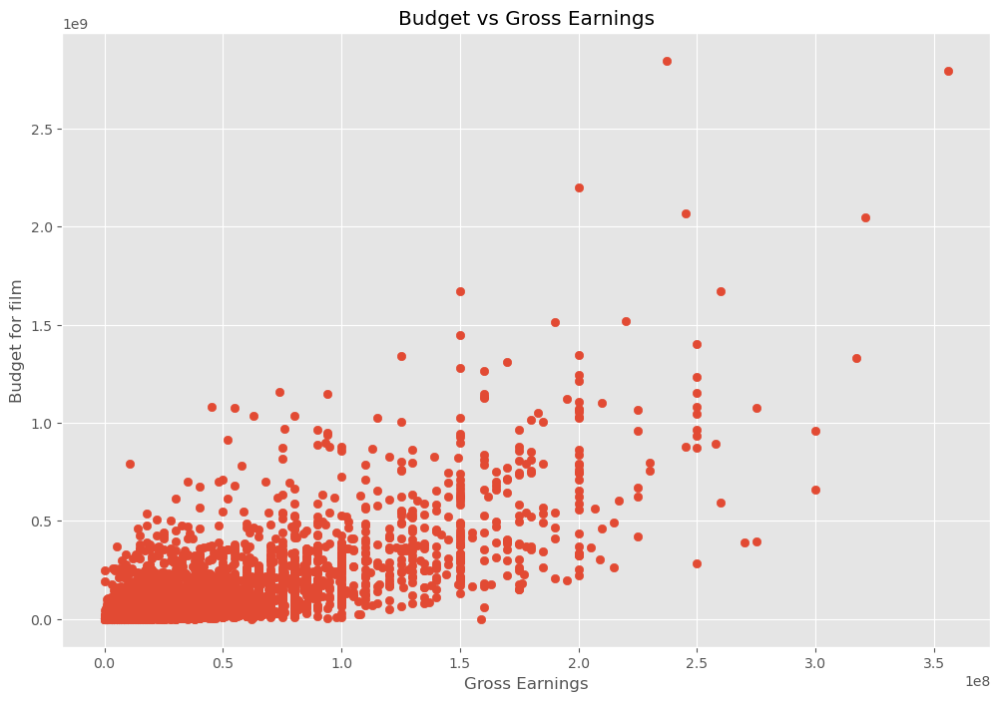

In [21]:
# My hypothesis on contributing factors to the gross of the movie
# Budget has a high correlation
# Company will have a high correlation

# Scatter plot with budget vs gross 

plt.scatter(x=df['budget'],y=df['gross'])

plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for film')

plt.show

<AxesSubplot:xlabel='budget', ylabel='gross'>

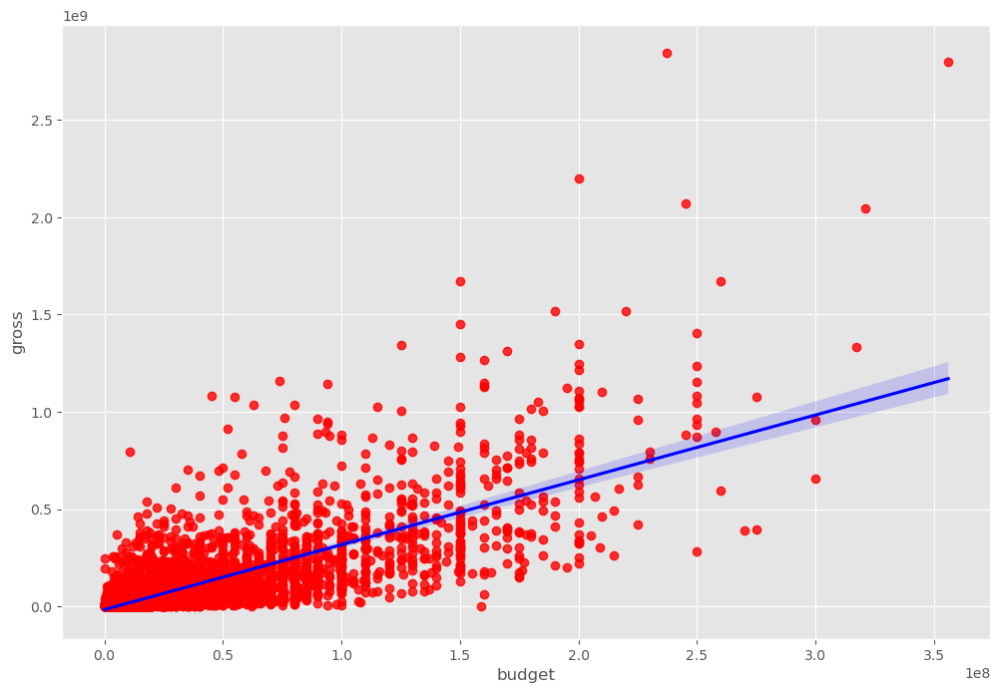

In [23]:
# Plot the Budget vs Gross using seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color": "blue"})

In [25]:
# Diving deeper into the data to check if there is any correlation

df.corr(method='pearson') # pearson, kendall, spearman 

# High Correlation between Budget and Gross, hypothesis was correct

,year,score,votes,budget,gross,runtime,yearcorrect
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077,0.998726
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068,0.061923
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303,0.203098
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695,0.320312
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796,0.268721
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000,0.075294
yearcorrect,0.998726,0.061923,0.203098,0.320312,0.268721,0.075294,1.000000


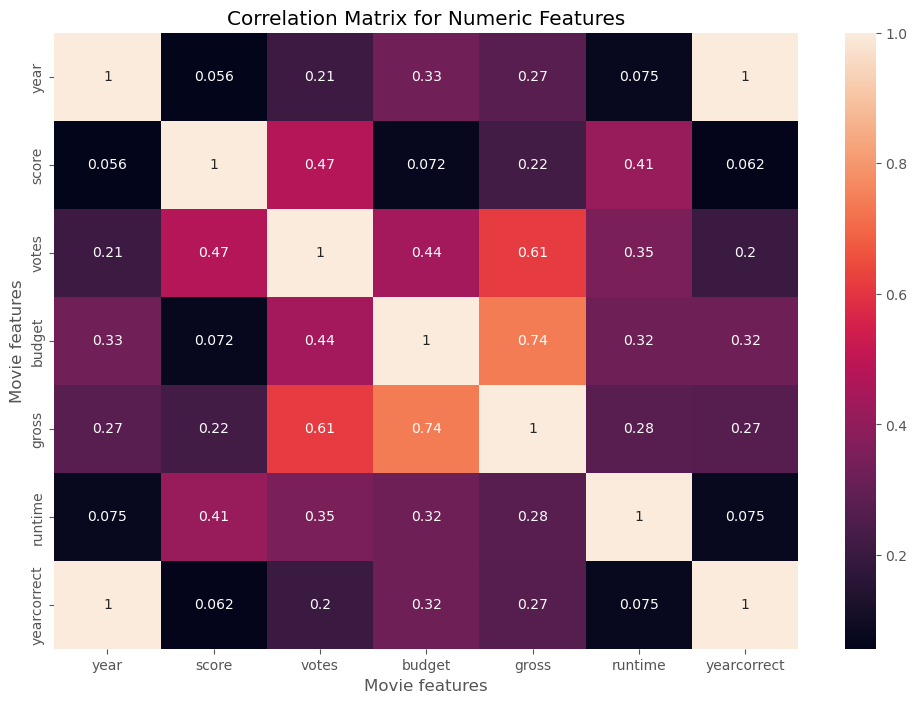

In [27]:
correlation_matrix = df.corr(method='pearson')
    
sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie features')
plt.ylabel('Movie features')

plt.show()


In [28]:
# Look at Company 

Companies = df['company']
print(Companies)

0                                            Warner Bros.
1                                       Columbia Pictures
2                                               Lucasfilm
3                                      Paramount Pictures
4                                          Orion Pictures
5                                      Paramount Pictures
6                                      Universal Pictures
7                            Chartoff-Winkler Productions
8                                          Dovemead Films
9                                          United Artists
10                                    The Malpaso Company
11                                           C.A.T. Films
12                                     Paramount Pictures
13                                     Paramount Pictures
14                                      Filmways Pictures
15                                        Rastar Pictures
17                                              IPC Films
18            

In [35]:
companies = []

for company in df['company']:
    if company not in companies:
        companies.append(company)
        print(company)
        
print(len(companies))

Warner Bros.
Columbia Pictures
Lucasfilm
Paramount Pictures
Orion Pictures
Universal Pictures
Chartoff-Winkler Productions
Dovemead Films
United Artists
The Malpaso Company
C.A.T. Films
Filmways Pictures
Rastar Pictures
IPC Films
AVCO Embassy Pictures
Lorimar Film Entertainment
Partisan Productions
Bryna Productions
Twentieth Century Fox
Cattle Annie Productions
PolyGram Filmed Entertainment
Camp Hill
Melvin Simon Productions
Jack Rollins & Charles H. Joffe Productions
International Cinema
Mulberry Square Productions
American Cinema Productions
Walt Disney Productions
Borough Park Productions
Polygram Pictures
Renaissance Pictures
Astral Bellevue Pathé
Charles H. Schneer Productions
Cinema '84
Kennedy Miller Productions
Golden Harvest Company
Mann/Caan Productions
HandMade Films
Georgetown Productions Inc.
Eon Productions
Dino De Laurentiis Company
Major Studio Partners
Barclays Mercantile Industrial Finance
Walt Disney Animation Studios
Enigma Productions
Metro-Goldwyn-Mayer (MGM)
Bro

In [45]:
studios = df.groupby(['company', 'gross'])

studios.first()

df.groupby(['company', 'gross']).size()


company                                                          gross     
"DIA" Productions GmbH & Co. KG                                  44350926      1
"Weathering With You" Film Partners                              193457467     1
.406 Production                                                  10580         1
1492 Pictures                                                    87423861      1
                                                                 129832389     1
1818 Productions                                                 12232628      1
19 Entertainment                                                 4928883       1
1978 Films                                                       40656399      1
1984 Private Defense Contractors                                 58834384      1
2 Loop Films                                                     264349        1
2.0 Entertainment                                                122810399     1
2.4.7. Films                     

In [90]:
df_numerical = df

for col_name in df_numerical.columns:
    if(df_numerical[col_name].dtype == 'object'):
        df_numerical[col_name] = df_numerical[col_name].astype('category')
        df_numerical[col_name] = df_numerical[col_name].cat.codes

        
df_numerical        

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,6587,6,6,1980,1705,8.4,927000,2589,4014,1047,54,19000000,46998772,2319,146.0
1,5573,6,1,1980,1492,5.8,65000,2269,1632,327,55,4500000,58853106,731,104.0
2,5142,4,0,1980,1771,8.7,1200000,1111,2567,1745,55,18000000,538375067,1540,124.0
3,286,4,4,1980,1492,7.7,221000,1301,2000,2246,55,3500000,83453539,1812,88.0
4,1027,6,4,1980,1543,7.3,108000,1054,521,410,55,6000000,39846344,1777,98.0
5,2109,6,10,1980,2502,6.4,123000,2528,4362,241,55,550000,39754601,1812,95.0
6,5574,6,0,1980,1771,7.9,188000,1412,838,1277,55,27000000,115229890,2281,133.0
7,4436,6,3,1980,699,8.2,330000,1829,1769,2240,55,18000000,23402427,631,129.0
8,5281,4,0,1980,1753,6.8,101000,2306,1979,877,55,54000000,108185706,883,127.0
9,6213,6,3,1980,2286,7.0,10000,2864,423,589,55,10000000,15795189,2272,100.0


In [94]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,6587,6,6,1980,1705,8.4,927000,2589,4014,1047,54,19000000,46998772,2319,146.0
1,5573,6,1,1980,1492,5.8,65000,2269,1632,327,55,4500000,58853106,731,104.0
2,5142,4,0,1980,1771,8.7,1200000,1111,2567,1745,55,18000000,538375067,1540,124.0
3,286,4,4,1980,1492,7.7,221000,1301,2000,2246,55,3500000,83453539,1812,88.0
4,1027,6,4,1980,1543,7.3,108000,1054,521,410,55,6000000,39846344,1777,98.0


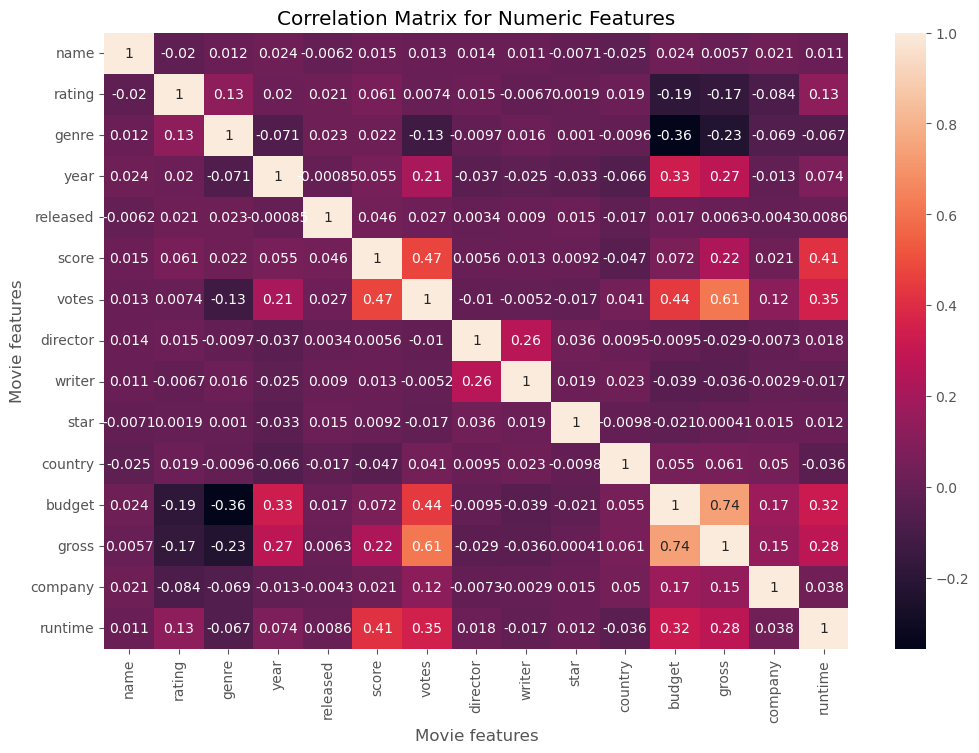

In [92]:
correlation_matrix = df_numerical.corr(method='pearson')
    
sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie features')
plt.ylabel('Movie features')

plt.show()

In [ ]:
# Votes and Budget has the highest correlation with Gross
# Company has a low correlation when it comes to Gross income of the movie